Processing GRIA1...


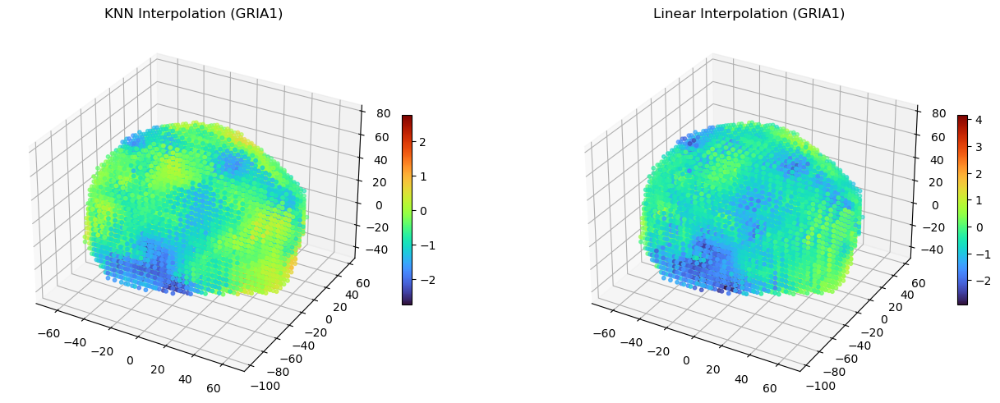

Processing GRIA2...


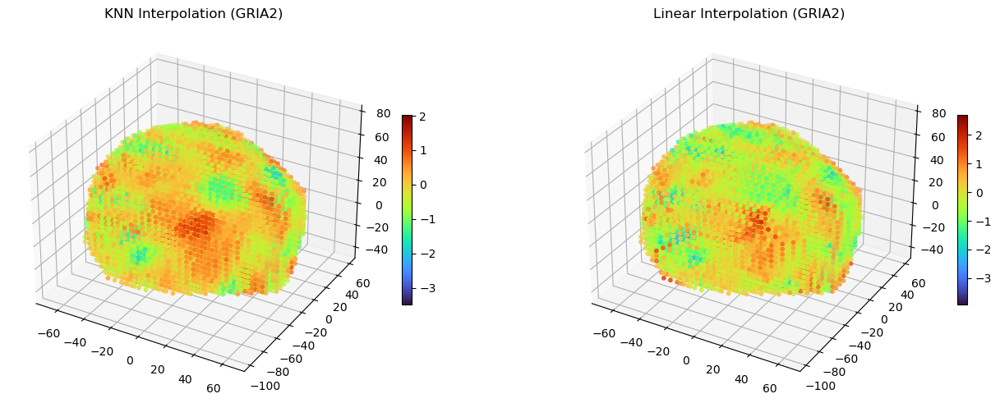

Processing GRIA3...


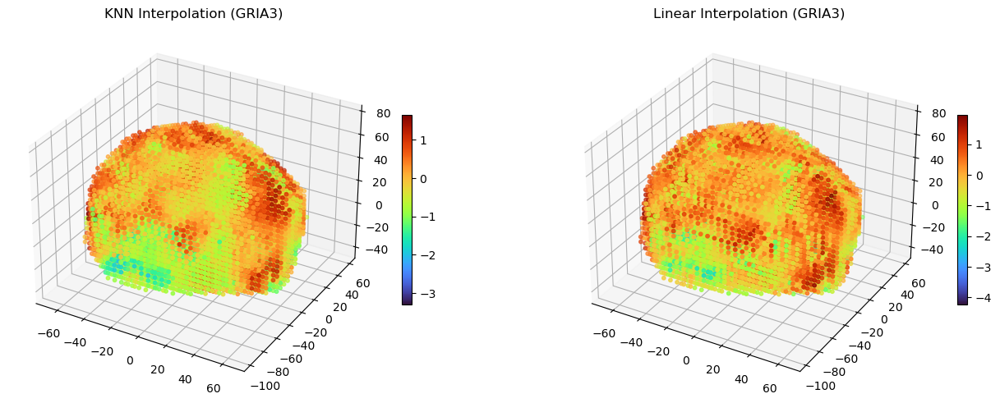

Processing GRIA4...


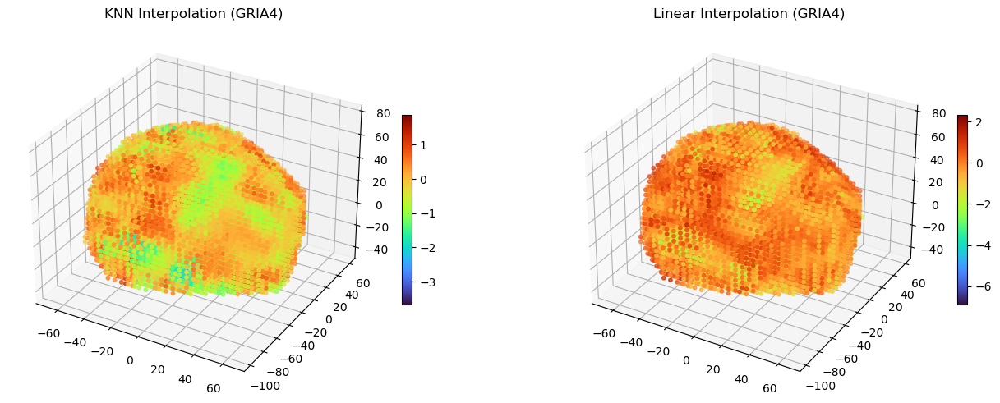

Processing GRIN1...


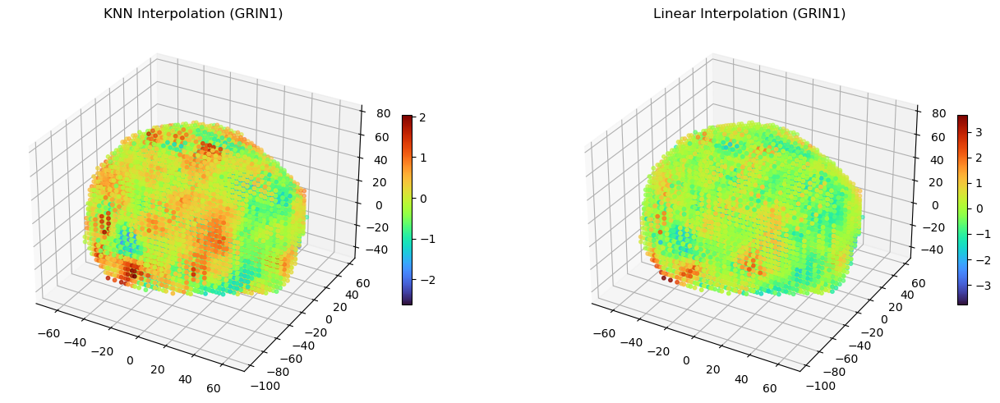

Processing GRIN2A...


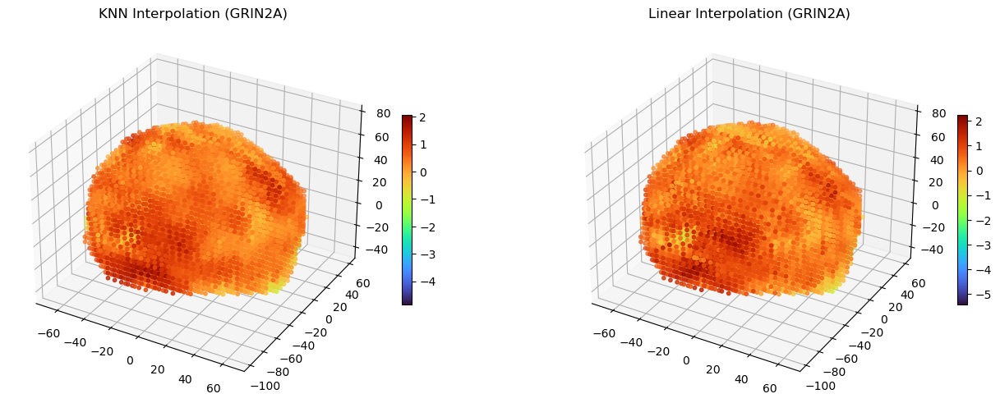

Processing GRIN2B...


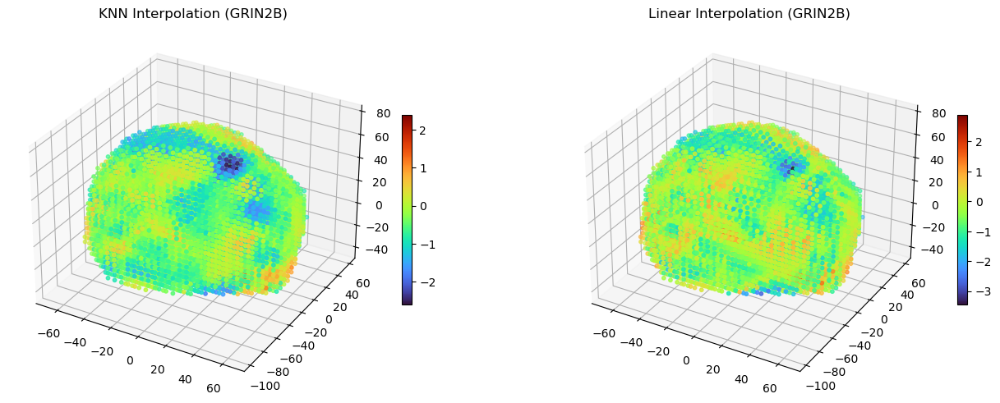

Processing GRIN2C...


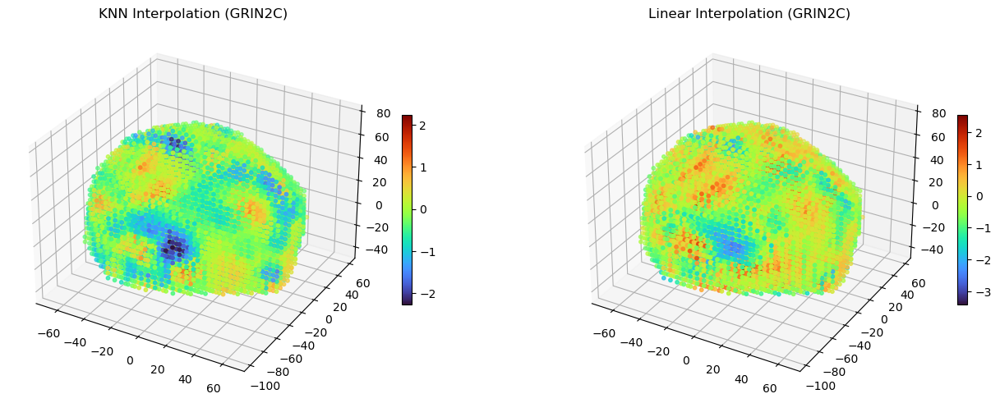

Processing GRIN2D...


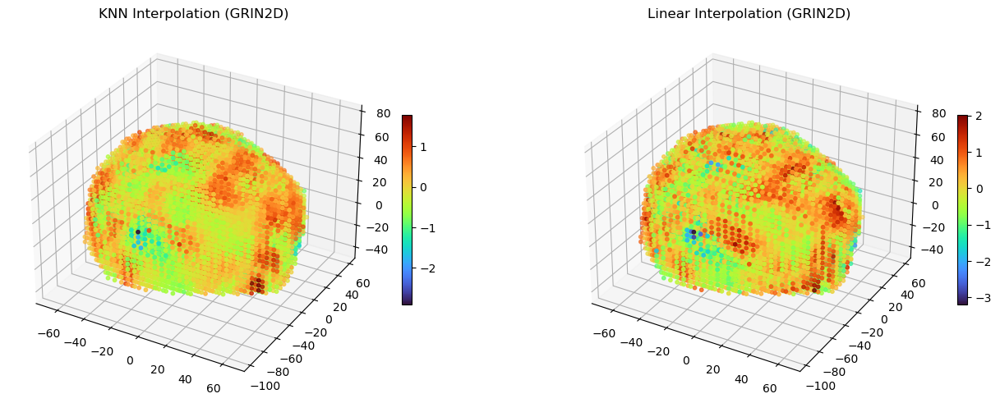

Processing GRM1...


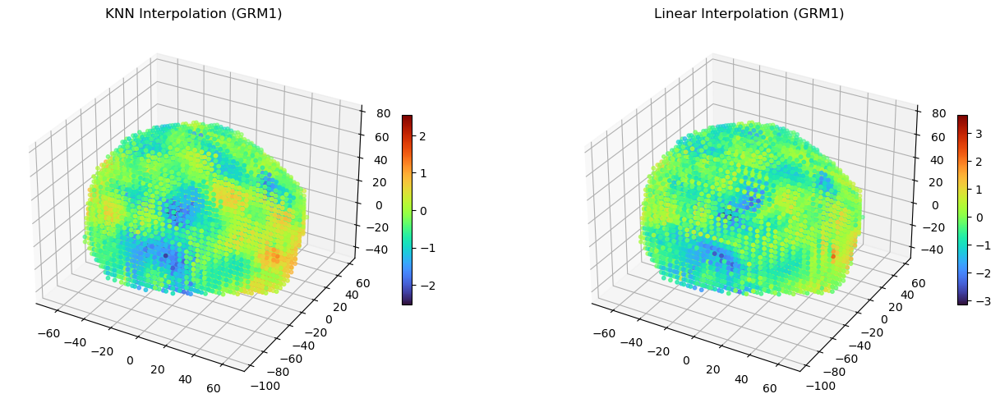

Processing GRM2...


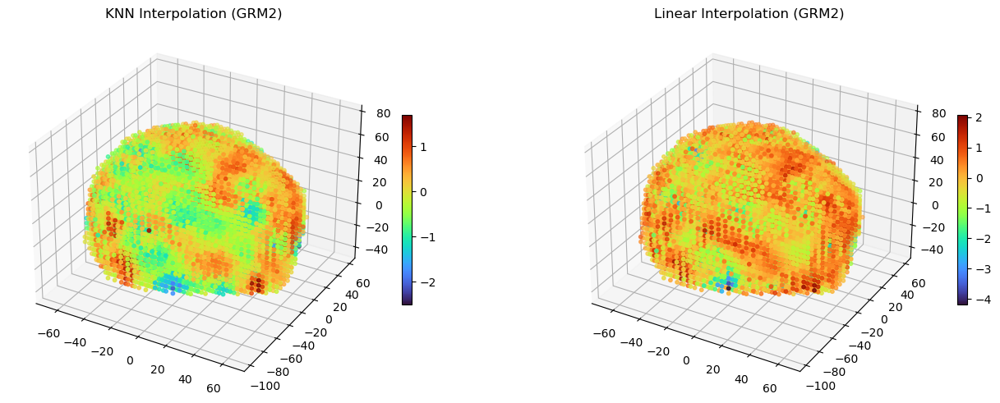

Processing GRM3...


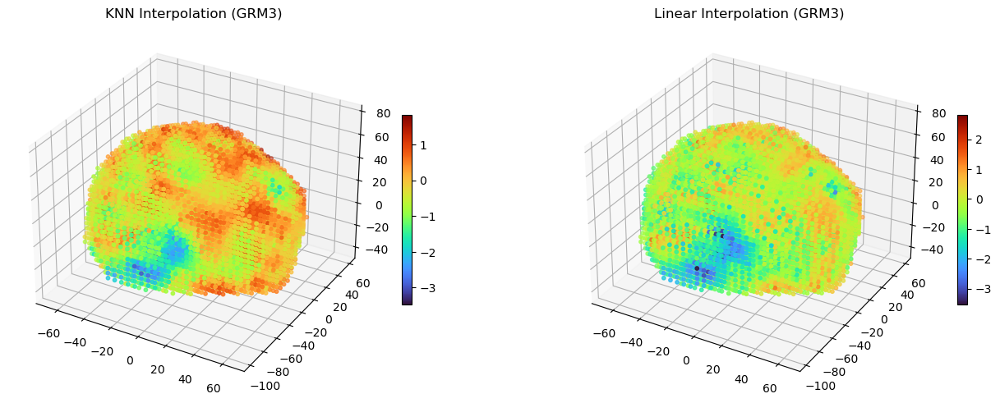

Processing GRM4...


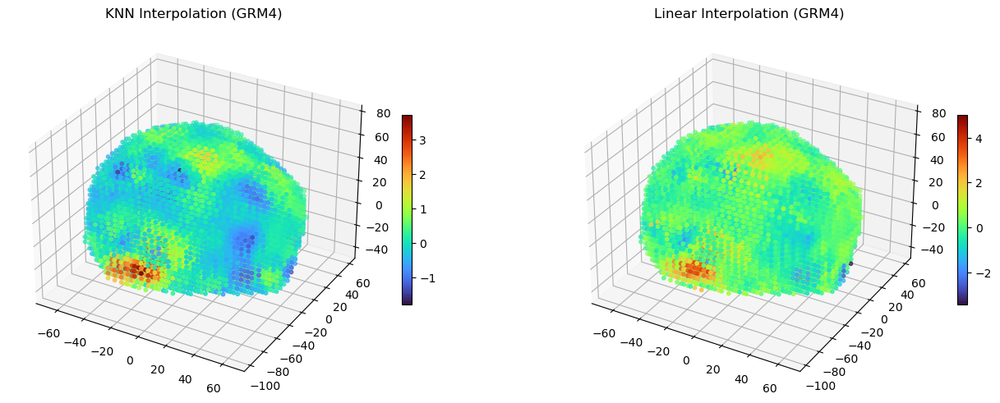

Processing GRM5...


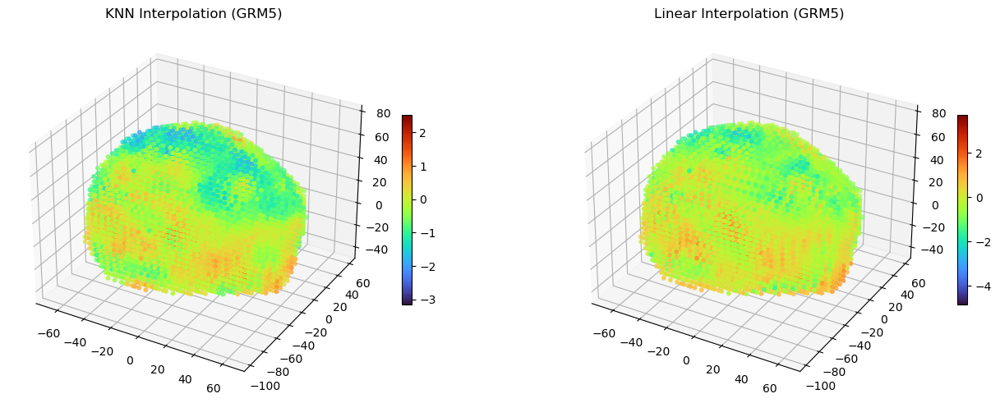

Processing GRM7...


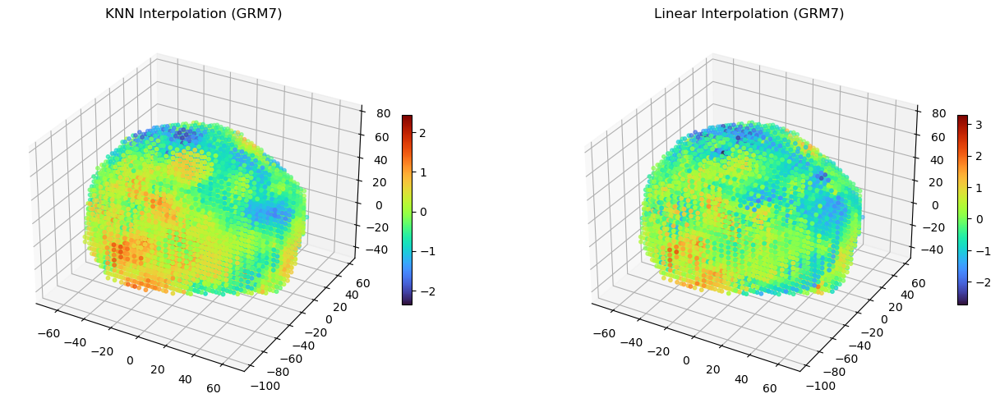

Processing GRM8...


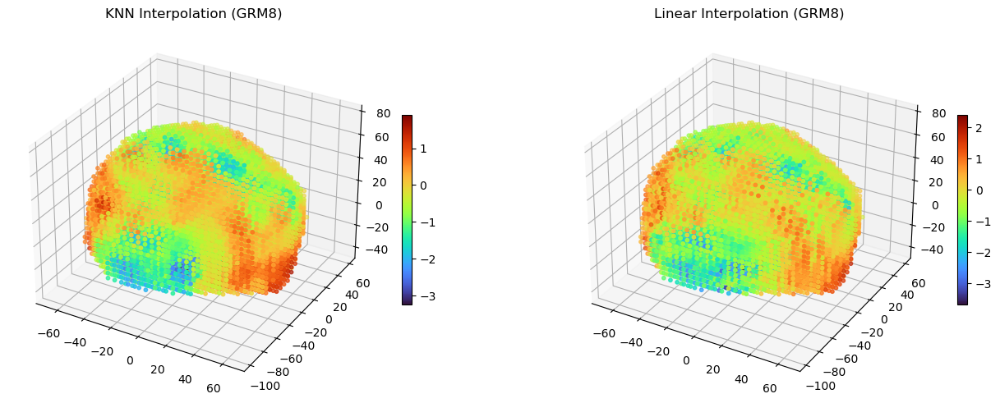

Processing GABRA1...


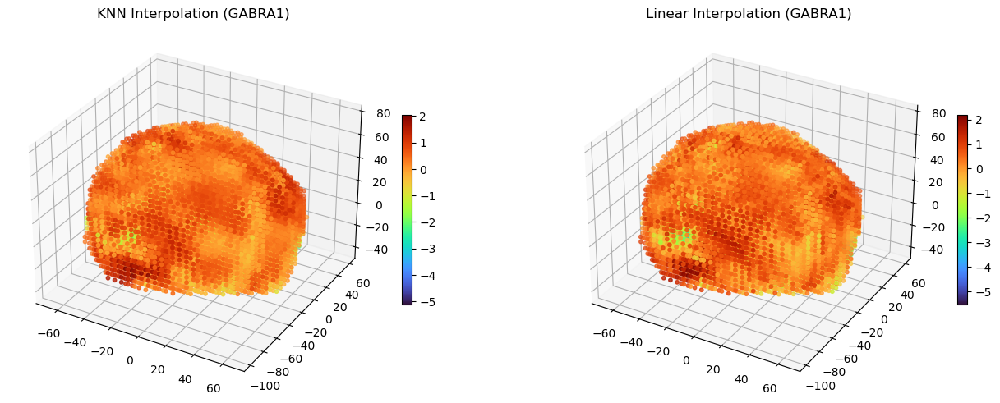

Processing GABRA2...


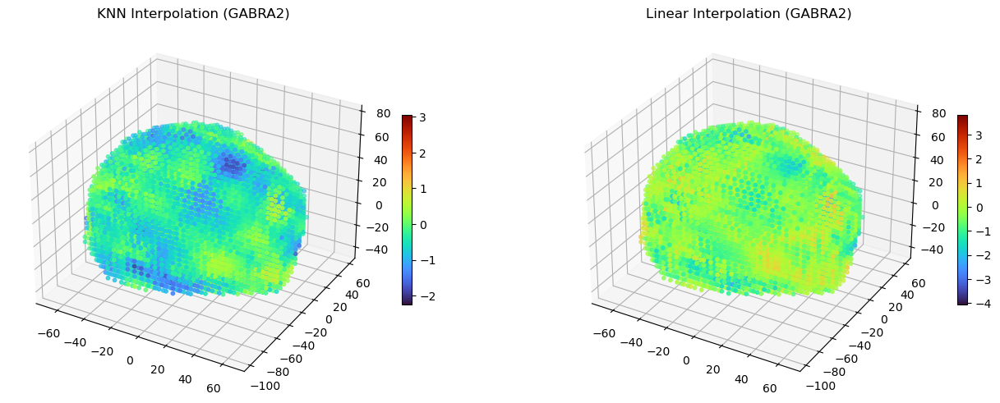

Processing GABRA3...


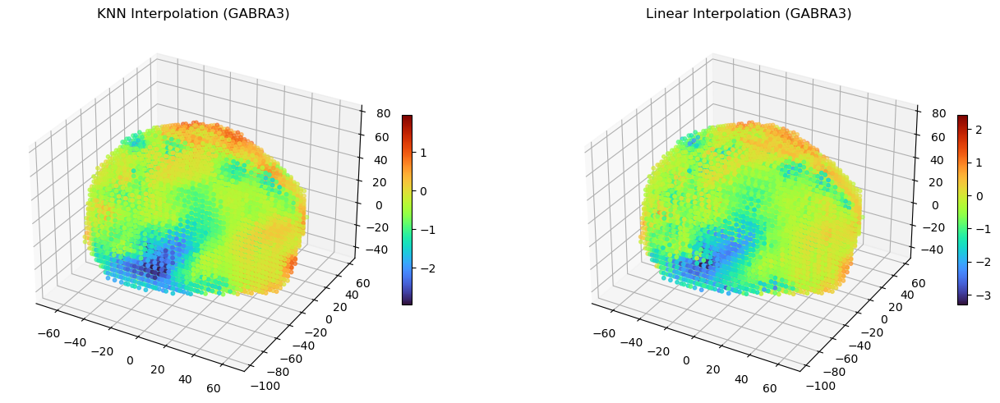

Processing GABRA4...


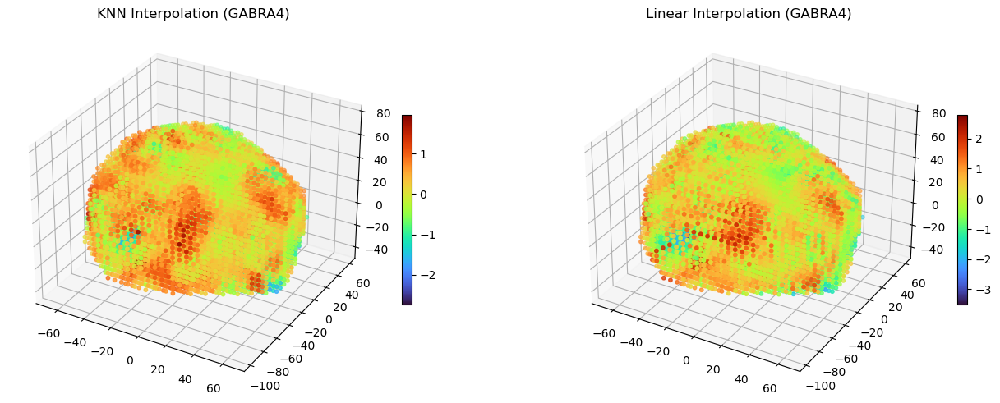

Processing GABRA5...


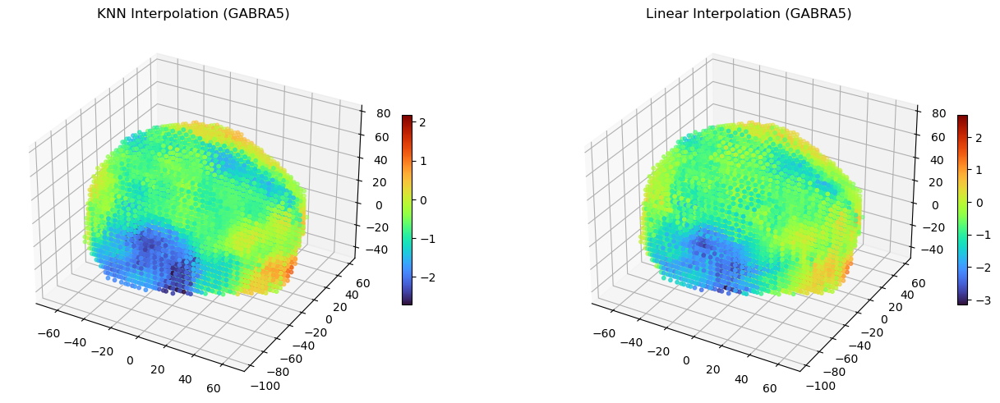

Processing GABRB1...


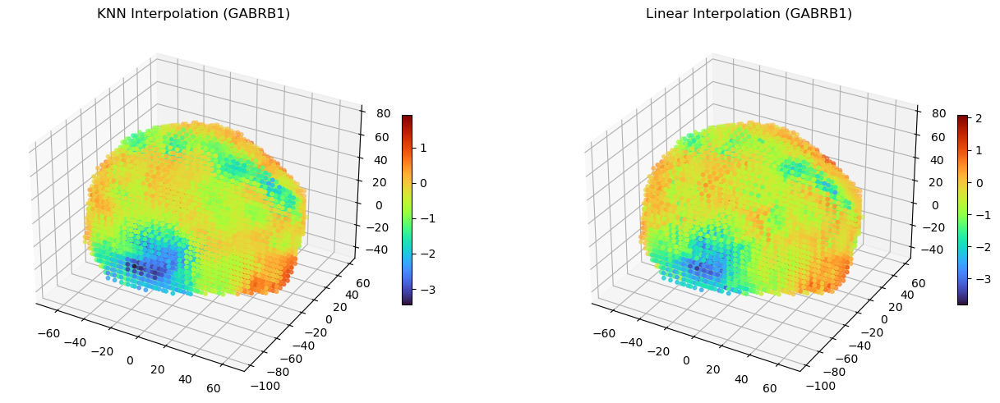

Processing GABRB2...


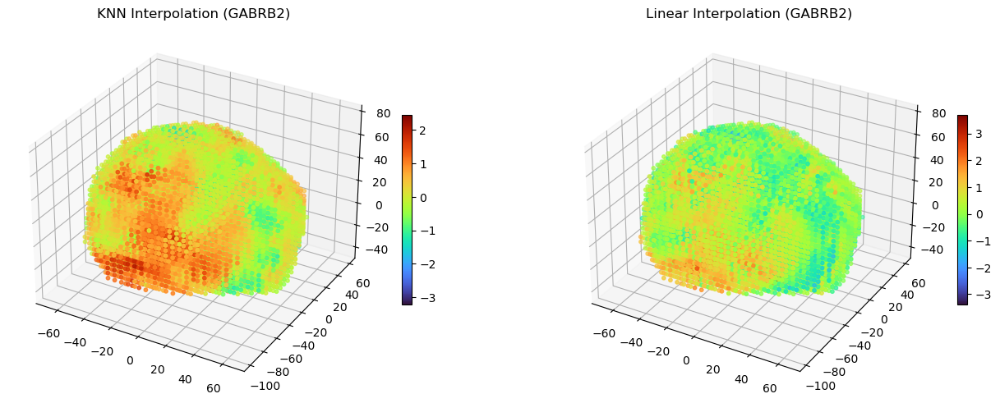

Processing GABRB3...


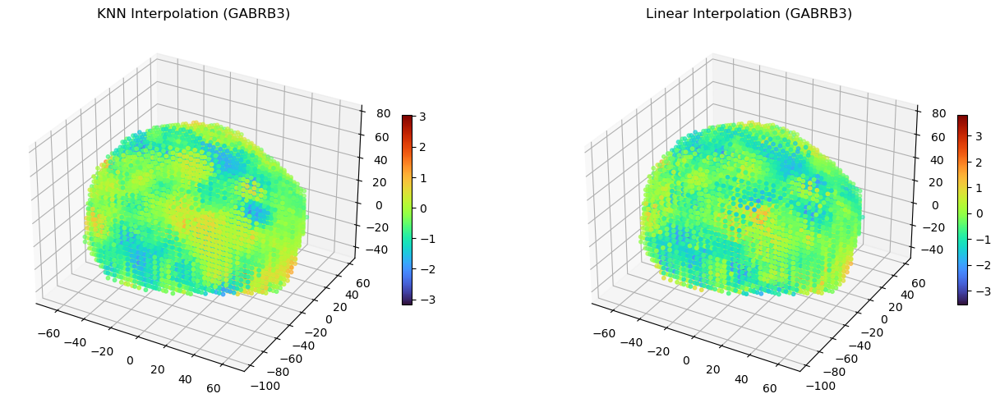

Processing GABRG1...


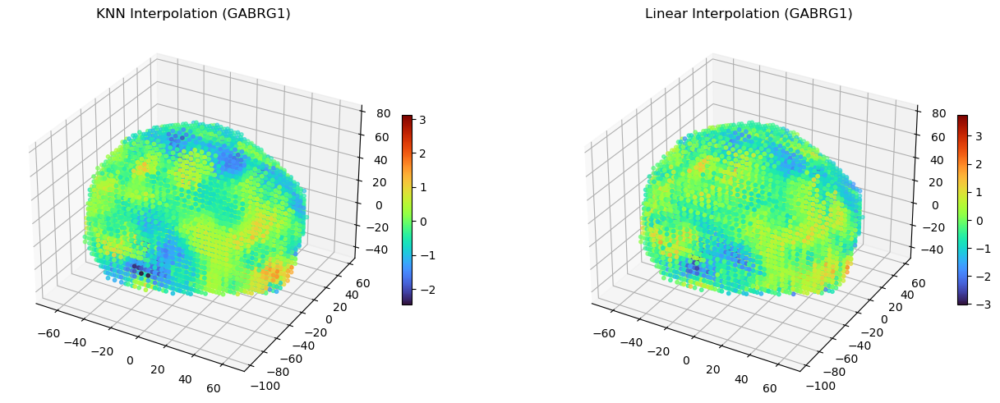

Processing GABRG2...


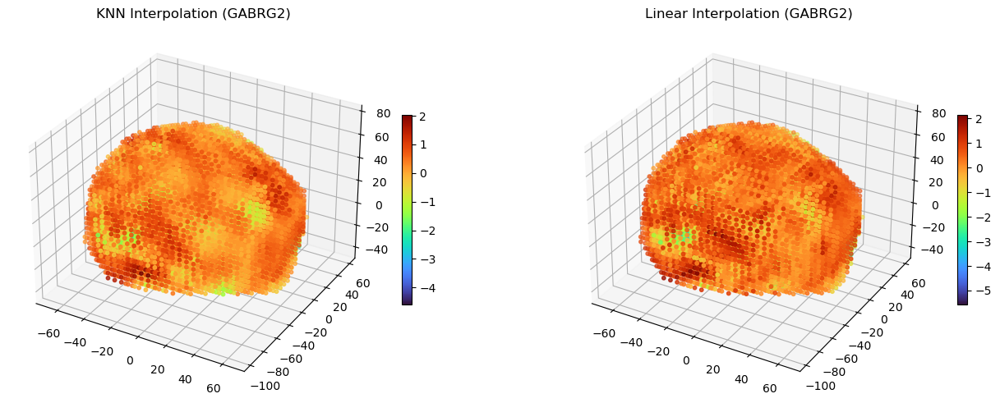

Processing GABRG3...


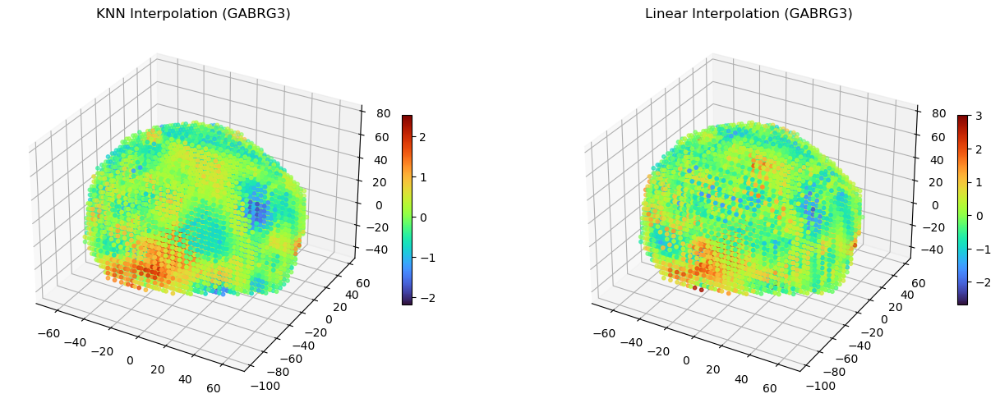

Processing CHRNB1...


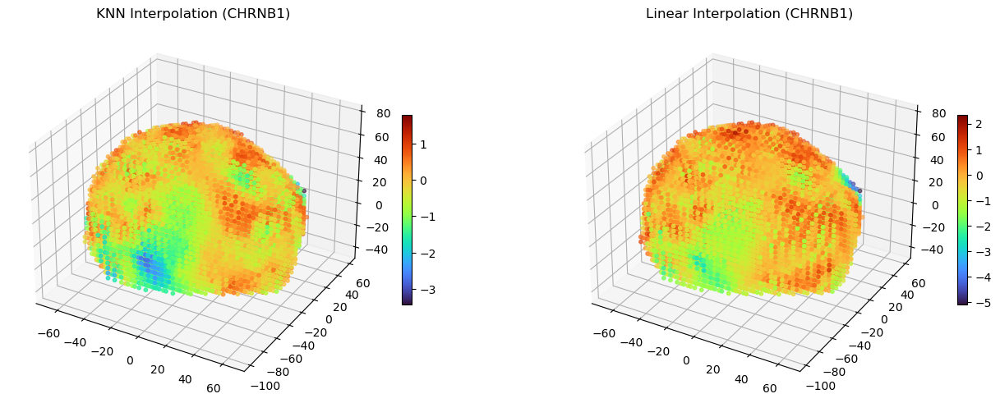

Processing CHRNB2...


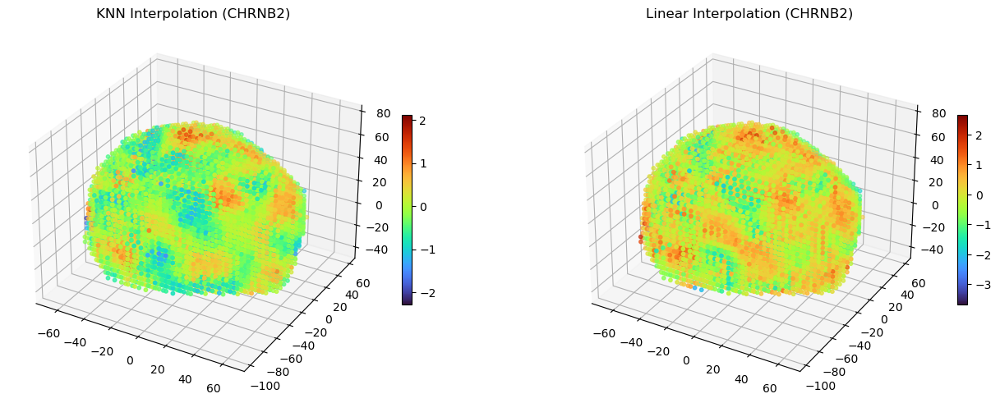

Processing CHRM1...


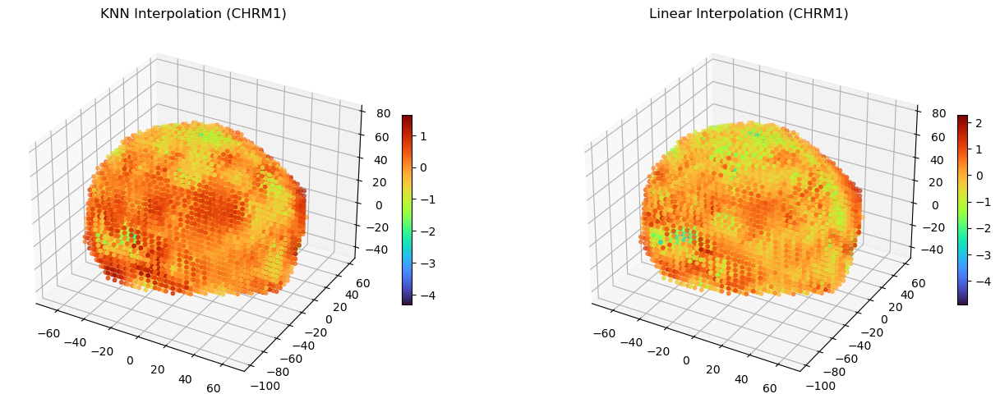

Processing CHRM2...


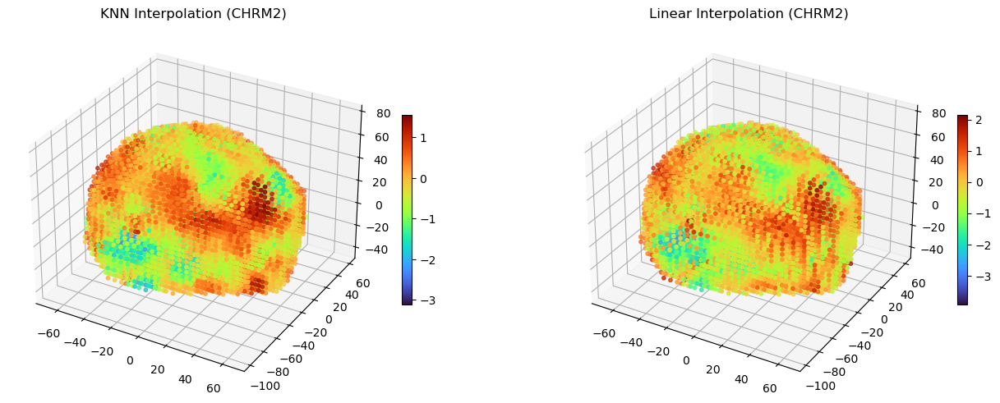

Processing CHRM3...


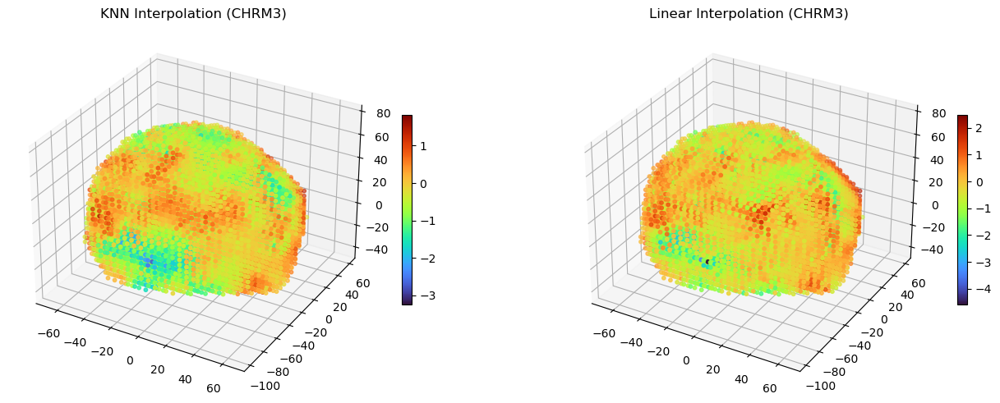

Processing CHRM4...


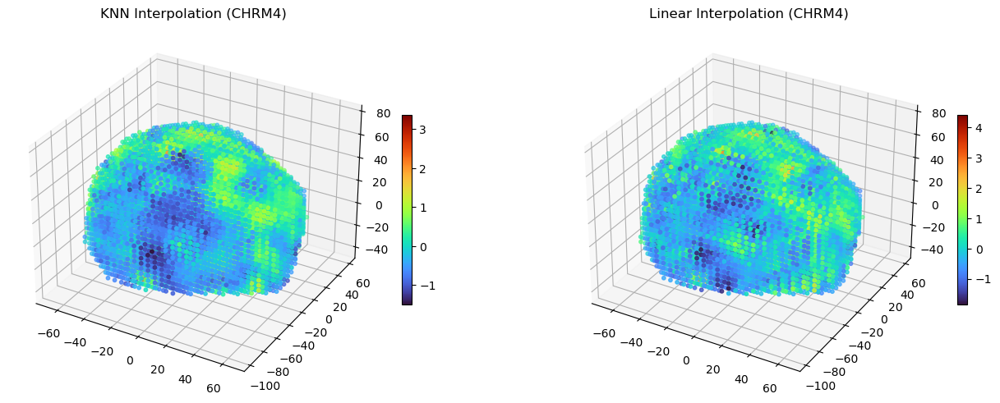

Processing CHRM5...


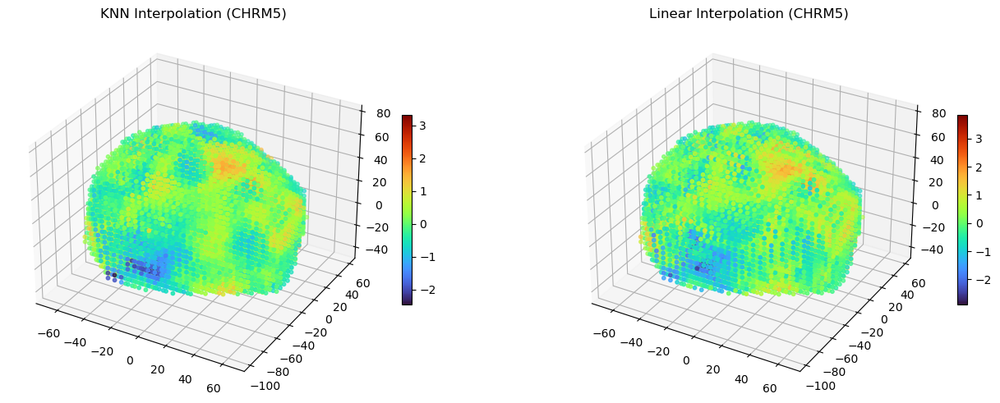

Processing HTR1A...


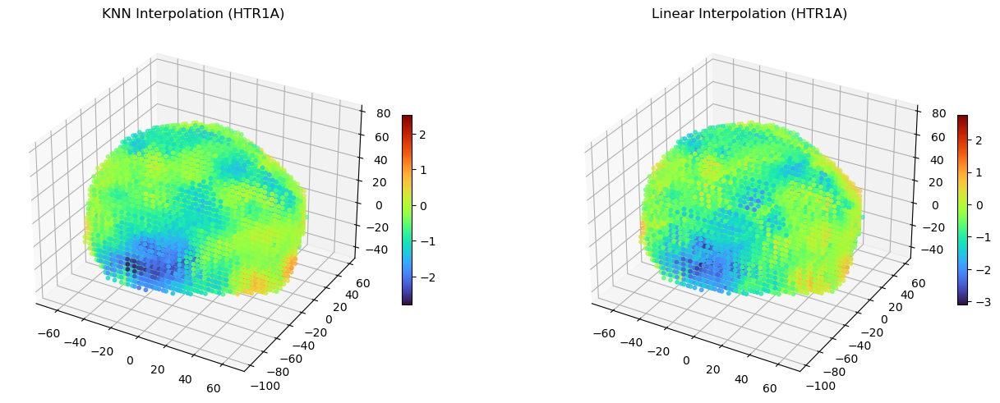

Processing HTR1E...


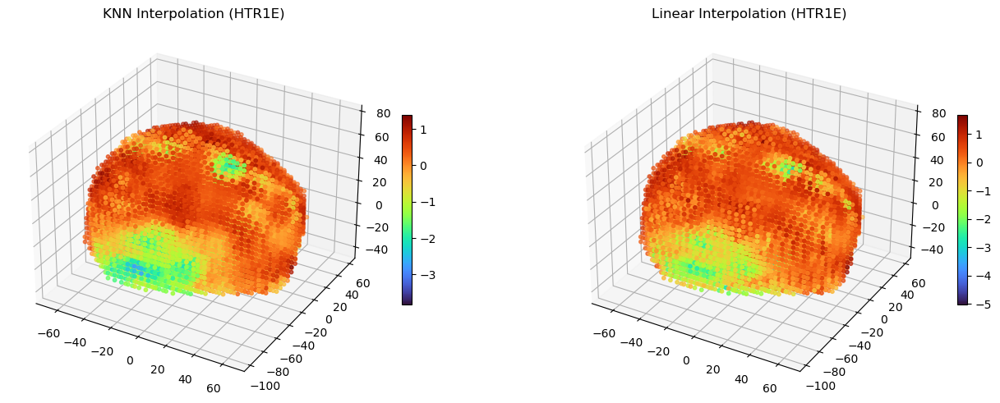

Processing HTR1F...


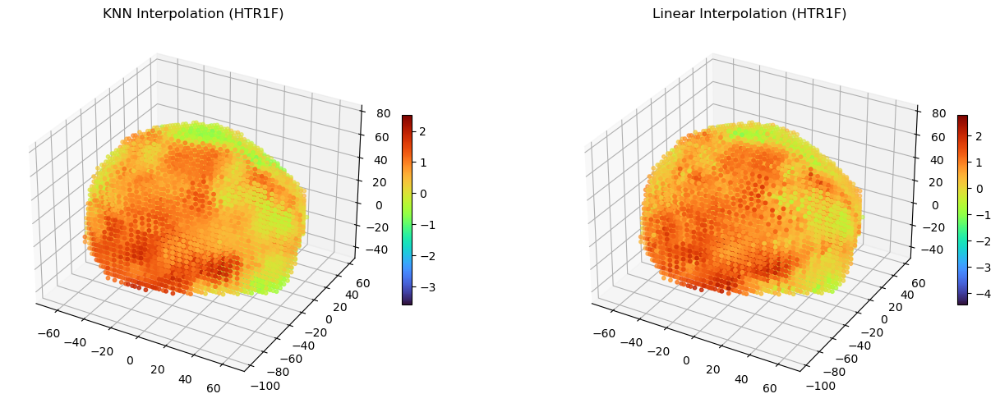

Processing HTR2A...


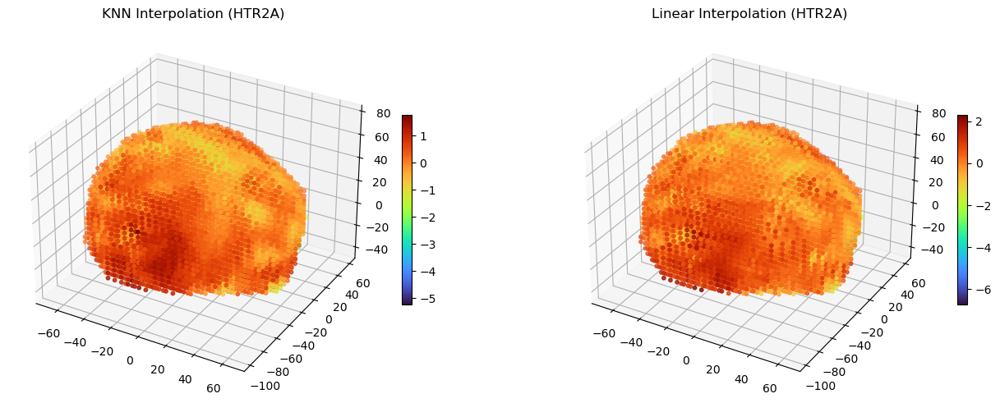

Processing HTR2C...


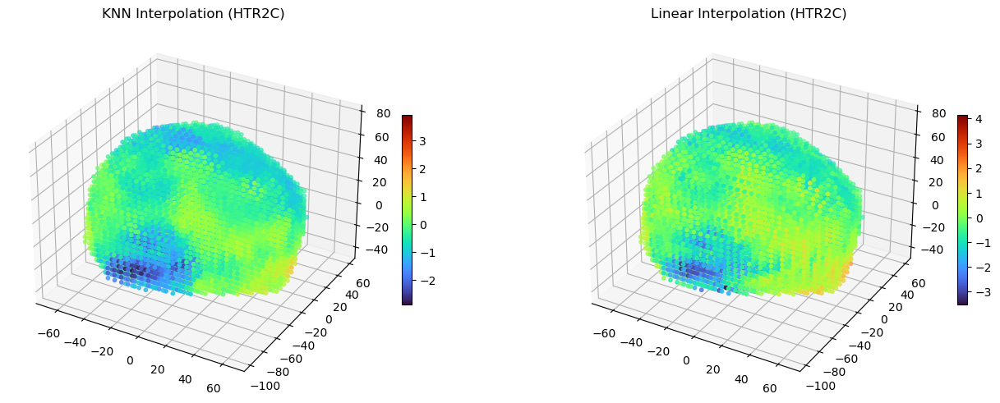

Processing HTR3B...


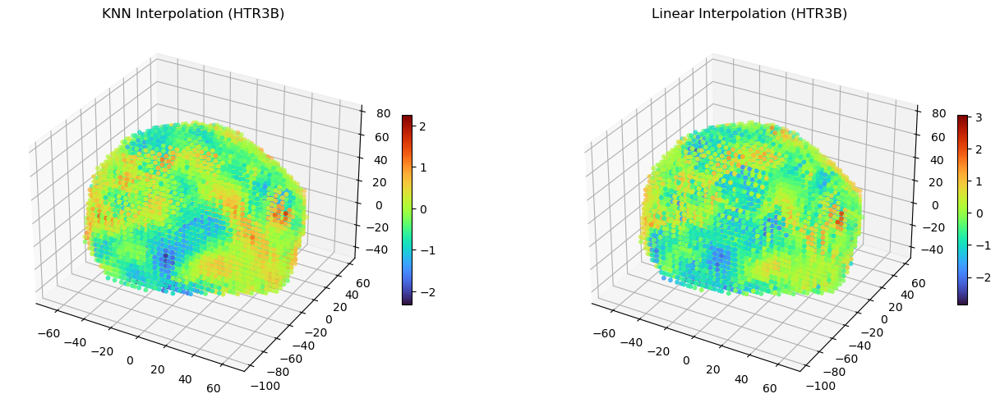

Processing HTR4...


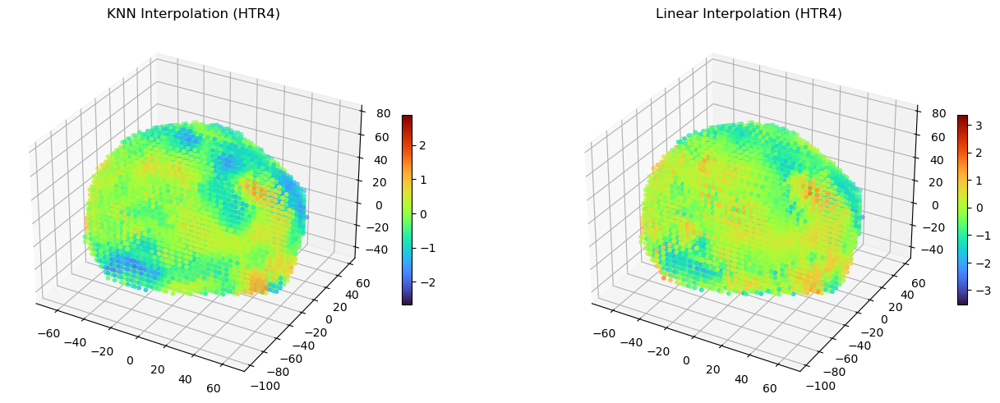

Processing HTR5A...


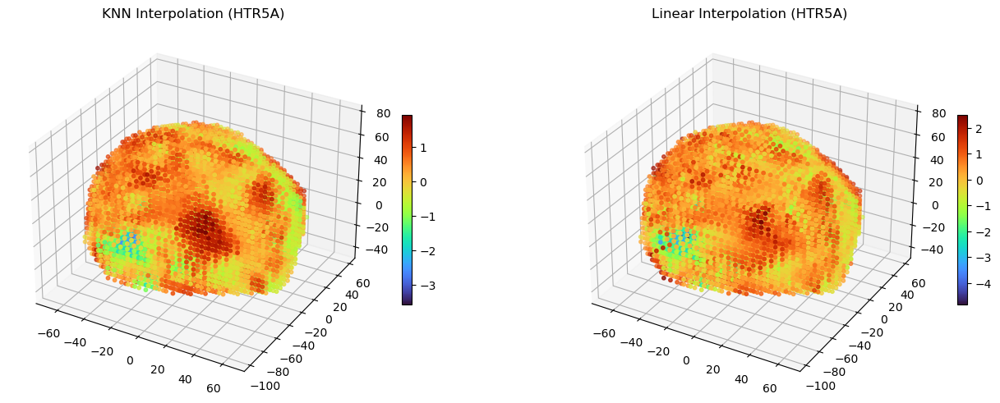

Processing HTR7...


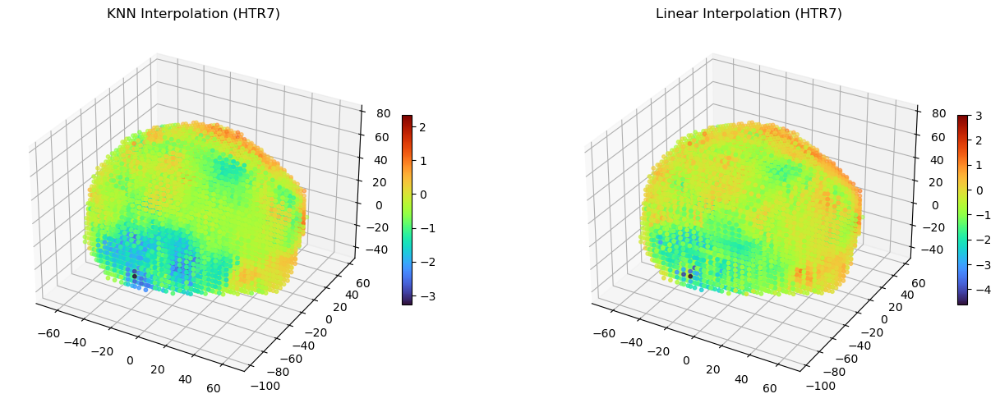

Processing DRD1...


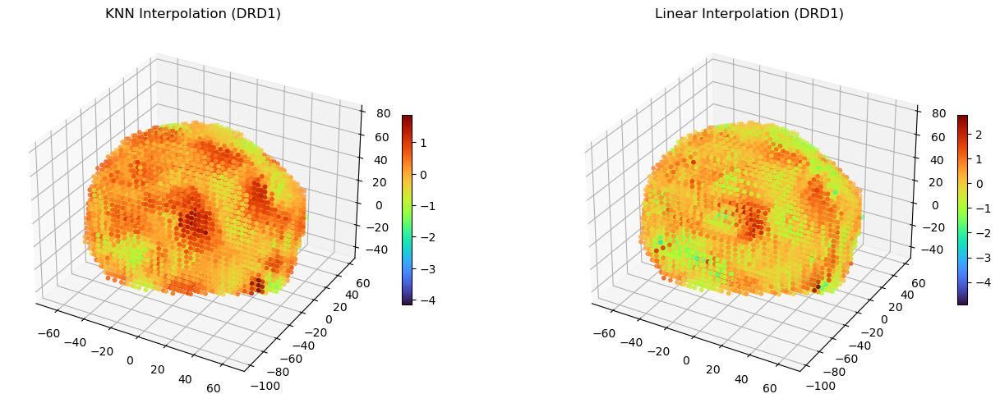

Processing DRD2...


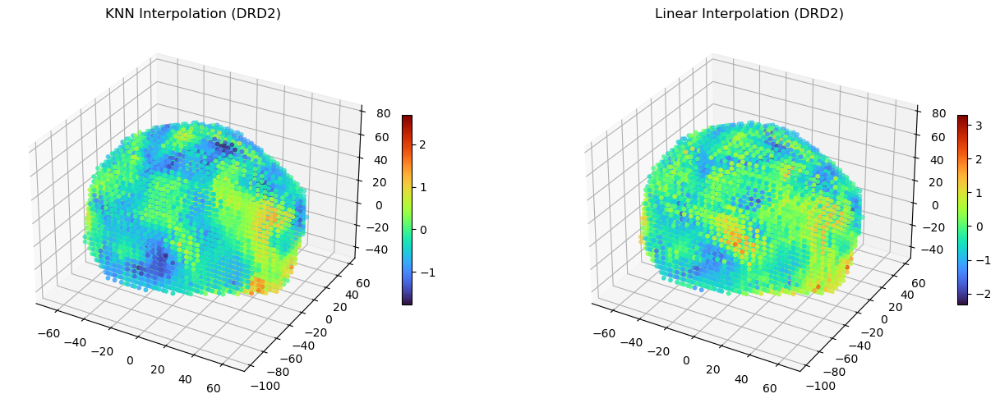

Processing DRD4...


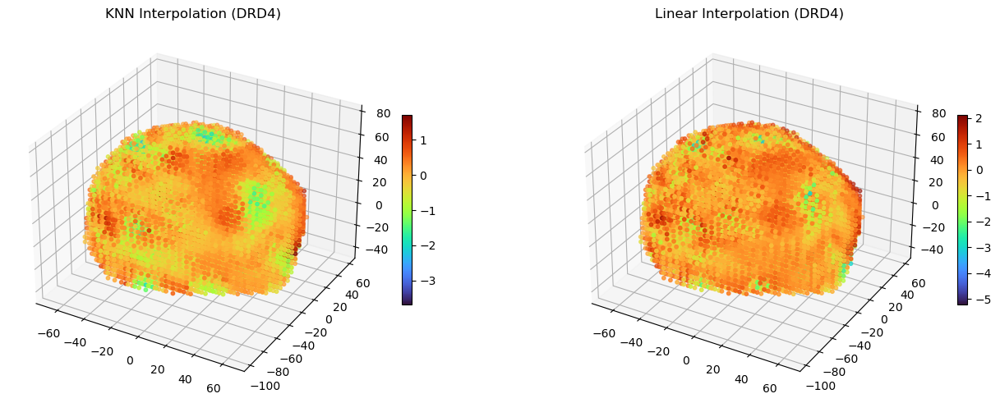


Interpolation Evaluation Metrics:
        KNN_MSE  KNN_MAE  KNN_RMSE  KNN_R²    Linear_MSE    Linear_MAE  \
GRIA1       0.0      0.0       0.0     1.0  2.465375e-31  1.344927e-16   
GRIA2       0.0      0.0       0.0     1.0  1.431626e-31  1.512131e-16   
GRIA3       0.0      0.0       0.0     1.0  2.212164e-31  1.730341e-16   
GRIA4       0.0      0.0       0.0     1.0  3.432816e-31  1.721057e-16   
GRIN1       0.0      0.0       0.0     1.0  2.174581e-31  1.709747e-16   
GRIN2A      0.0      0.0       0.0     1.0  1.072830e-31  1.217623e-16   
GRIN2B      0.0      0.0       0.0     1.0  2.193894e-31  1.557669e-16   
GRIN2C      0.0      0.0       0.0     1.0  1.740525e-31  1.553266e-16   
GRIN2D      0.0      0.0       0.0     1.0  3.263859e-31  1.866289e-16   
GRM1        0.0      0.0       0.0     1.0  3.022691e-31  1.640704e-16   
GRM2        0.0      0.0       0.0     1.0  1.693656e-31  1.605330e-16   
GRM3        0.0      0.0       0.0     1.0  1.512338e-31  1.499537e-16   
GRM

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.interpolate import griddata
from scipy.spatial import ConvexHull, Delaunay
from math import sqrt
import pandas as pd

# Load the gene expression data
coords = np.load('expression_coords.npy')
expression_data = np.load('expression.npy', allow_pickle=True).item()

# Extract x, y, z coordinates
x, y, z = coords[:, 0], coords[:, 1], coords[:, 2]
xyz_points = np.column_stack((x, y, z))

# Create a convex hull to define the brain boundaries
hull = ConvexHull(xyz_points)
delaunay = Delaunay(xyz_points)

# Define a grid for 3D interpolation
resolution = 30
grid_x, grid_y, grid_z = np.meshgrid(
    np.linspace(min(x), max(x), resolution),
    np.linspace(min(y), max(y), resolution),
    np.linspace(min(z), max(z), resolution)
)

# Flatten grid points for interpolation
grid_points = np.column_stack((grid_x.ravel(), grid_y.ravel(), grid_z.ravel()))

# Mask out points outside the convex hull
inside_hull = delaunay.find_simplex(grid_points) >= 0
valid_points = grid_points[inside_hull]

# Prepare a dictionary to store evaluation metrics
evaluation_metrics = {}

# Loop over all genes and perform KNN and Linear interpolation
for gene, values in expression_data.items():
    print(f'Processing {gene}...')

    # KNN Interpolation
    knn = KNeighborsRegressor(n_neighbors=5, weights='distance')
    knn.fit(xyz_points, values)
    knn_grid_values = knn.predict(valid_points)

    # Linear Interpolation
    linear_grid_values = griddata(
        (x, y, z), values, (grid_x, grid_y, grid_z), method='linear'
    )

    # Evaluate interpolation performance
    knn_interp_values = knn.predict(xyz_points)
    linear_interp_values = griddata((x, y, z), values, (x, y, z), method='linear')

    knn_scores = {
        "MSE": mean_squared_error(values, knn_interp_values),
        "MAE": mean_absolute_error(values, knn_interp_values),
        "RMSE": sqrt(mean_squared_error(values, knn_interp_values)),
        "R²": r2_score(values, knn_interp_values)
    }

    linear_scores = {
        "MSE": mean_squared_error(values, linear_interp_values),
        "MAE": mean_absolute_error(values, linear_interp_values),
        "RMSE": sqrt(mean_squared_error(values, linear_interp_values)),
        "R²": r2_score(values, linear_interp_values)
    }

    evaluation_metrics[gene] = {
        "KNN_MSE": knn_scores["MSE"], "KNN_MAE": knn_scores["MAE"], "KNN_RMSE": knn_scores["RMSE"], "KNN_R²": knn_scores["R²"],
        "Linear_MSE": linear_scores["MSE"], "Linear_MAE": linear_scores["MAE"], "Linear_RMSE": linear_scores["RMSE"], "Linear_R²": linear_scores["R²"]
    }

    # Plotting
    fig, axes = plt.subplots(1, 2, figsize=(16, 6), subplot_kw={'projection': '3d'})

    # KNN Plot
    sc1 = axes[0].scatter(valid_points[:, 0], valid_points[:, 1], valid_points[:, 2],
                           c=knn_grid_values, cmap='turbo', s=10)
    axes[0].set_title(f'KNN Interpolation ({gene})')
    fig.colorbar(sc1, ax=axes[0], shrink=0.5)

    # Linear Plot
    sc2 = axes[1].scatter(grid_x.ravel(), grid_y.ravel(), grid_z.ravel(),
                           c=linear_grid_values.ravel(), cmap='turbo', s=10)
    axes[1].set_title(f'Linear Interpolation ({gene})')
    fig.colorbar(sc2, ax=axes[1], shrink=0.5)

    plt.show()

# Display results
df_metrics = pd.DataFrame(evaluation_metrics).T
print("\nInterpolation Evaluation Metrics:")
print(df_metrics)


Shape of valid points: (12431, 3)
Processing GRIA1 using Linear and KNN Interpolation...
Processing GRIA2 using Linear and KNN Interpolation...
Processing GRIA3 using Linear and KNN Interpolation...
Processing GRIA4 using Linear and KNN Interpolation...
Processing GRIN1 using Linear and KNN Interpolation...
Processing GRIN2A using Linear and KNN Interpolation...
Processing GRIN2B using Linear and KNN Interpolation...
Processing GRIN2C using Linear and KNN Interpolation...
Processing GRIN2D using Linear and KNN Interpolation...
Processing GRM1 using Linear and KNN Interpolation...
Processing GRM2 using Linear and KNN Interpolation...
Processing GRM3 using Linear and KNN Interpolation...
Processing GRM4 using Linear and KNN Interpolation...
Processing GRM5 using Linear and KNN Interpolation...
Processing GRM7 using Linear and KNN Interpolation...
Processing GRM8 using Linear and KNN Interpolation...
Processing GABRA1 using Linear and KNN Interpolation...
Processing GABRA2 using Linear an

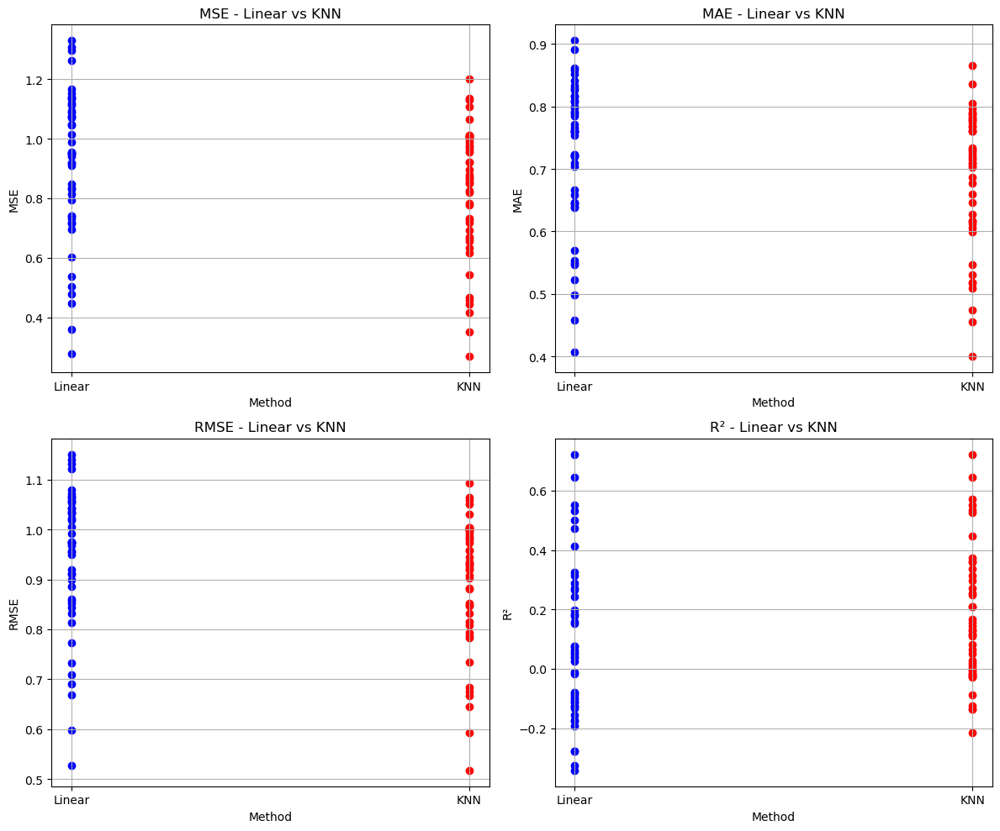


Average Metrics for Linear vs KNN Across Genes:
Linear:
 MSE     0.909035
MAE     0.721492
RMSE    0.939950
R²      0.083448
dtype: float64
KNN:
 MSE     0.820125
MAE     0.686594
RMSE    0.893684
R²      0.167767
dtype: float64


In [11]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsRegressor
from scipy.interpolate import griddata
from scipy.spatial import ConvexHull, Delaunay
from math import sqrt
import pandas as pd

# Load the gene expression data
expression_coords = np.load('expression_coords.npy')
expression_data = np.load('expression.npy', allow_pickle=True).item()

# Extract x, y, z coordinates
x, y, z = expression_coords[:, 0], expression_coords[:, 1], expression_coords[:, 2]
xyz_points = np.column_stack((x, y, z))

# Create a convex hull and Delaunay triangulation for masking valid points
hull = ConvexHull(xyz_points)
delaunay = Delaunay(xyz_points)

# Define a grid for interpolation
resolution = 30
grid_x, grid_y, grid_z = np.meshgrid(
    np.linspace(min(x), max(x), resolution),
    np.linspace(min(y), max(y), resolution),
    np.linspace(min(z), max(z), resolution)
)

# Flatten the grid into points
grid_points = np.column_stack((grid_x.ravel(), grid_y.ravel(), grid_z.ravel()))

# Mask out points outside the convex hull
inside_hull = delaunay.find_simplex(grid_points) >= 0
valid_points = grid_points[inside_hull]

# ✅ Print the shape of valid points to debug
print(f"Shape of valid points: {valid_points.shape}")

# Set up cross-validation
num_folds = 10
kf = KFold(n_splits=num_folds, shuffle=True, random_state=42)

# Initialise dictionaries for storing metrics
evaluation_metrics_knn = {}
evaluation_metrics_linear = {}

# ✅ Try reducing the number of neighbors to avoid overfitting
n_neighbors = 5

# Iterate over each gene
for gene, values in expression_data.items():
    print(f"Processing {gene} using Linear and KNN Interpolation...")
    
    values = np.array(values)

    linear_results = []
    knn_results = []

    for train_index, test_index in kf.split(expression_coords):
        train_coords, test_coords = expression_coords[train_index], expression_coords[test_index]
        train_values, test_values = values[train_index], values[test_index]
        
        # ✅ Linear Interpolation
        pred_linear = griddata(train_coords, train_values, test_coords, method='linear')
        valid_indices = ~np.isnan(pred_linear)
        pred_linear = pred_linear[valid_indices]
        test_values_linear = test_values[valid_indices]
        
        if len(pred_linear) > 0:
            mse = mean_squared_error(test_values_linear, pred_linear)
            mae = mean_absolute_error(test_values_linear, pred_linear)
            rmse = sqrt(mse)
            r2 = r2_score(test_values_linear, pred_linear)
            linear_results.append([mse, mae, rmse, r2])
        
        # ✅ KNN Interpolation
        knn = KNeighborsRegressor(n_neighbors=n_neighbors, weights='distance')
        knn.fit(train_coords, train_values)
        pred_knn = knn.predict(test_coords)

        valid_indices = ~np.isnan(pred_knn)
        pred_knn = pred_knn[valid_indices]
        test_values_knn = test_values[valid_indices]

        if len(pred_knn) > 0:
            mse = mean_squared_error(test_values_knn, pred_knn)
            mae = mean_absolute_error(test_values_knn, pred_knn)
            rmse = sqrt(mse)
            r2 = r2_score(test_values_knn, pred_knn)
            knn_results.append([mse, mae, rmse, r2])
    
    # Store average results for each gene
    evaluation_metrics_linear[gene] = np.mean(linear_results, axis=0) if linear_results else [np.nan] * 4
    evaluation_metrics_knn[gene] = np.mean(knn_results, axis=0) if knn_results else [np.nan] * 4

# ✅ Convert metrics to DataFrame
linear_df = pd.DataFrame(evaluation_metrics_linear, index=['MSE', 'MAE', 'RMSE', 'R²']).T
knn_df = pd.DataFrame(evaluation_metrics_knn, index=['MSE', 'MAE', 'RMSE', 'R²']).T

# ✅ Create scatter plots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

metrics = ['MSE', 'MAE', 'RMSE', 'R²']

for i, metric in enumerate(metrics):
    axes[i].scatter(['Linear'] * len(linear_df), linear_df[metric], label='Linear', color='blue')
    axes[i].scatter(['KNN'] * len(knn_df), knn_df[metric], label='KNN', color='red')
    axes[i].set_title(f'{metric} - Linear vs KNN')
    axes[i].set_xlabel('Method')
    axes[i].set_ylabel(metric)
    axes[i].grid(True)

plt.tight_layout()
plt.show()

# ✅ Print summary of results
print("\nAverage Metrics for Linear vs KNN Across Genes:")
print("Linear:\n", linear_df.mean())
print("KNN:\n", knn_df.mean())
